In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import fft
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
import torchvision.transforms as transforms

from source import *
from source.config import Config
from source import propagator
from source.doe import DOE

from AdditionalFunctions import *

import numpy as np
%matplotlib widget
import matplotlib.pyplot as plt
from tqdm.notebook import trange, tqdm

from bspline.doe_by_bspline import DOE_by_bspline

In [7]:
batch_size = 10
 
transform = transforms.Compose([transforms.ToTensor()])

train_data = datasets.MNIST(root='../data', train=True, download=True, transform=transform)
test_data = datasets.MNIST(root='../data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle= True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle= False)

In [3]:
fi = 1/1.618

In [4]:
config = Config(array_size = 1024,
                doe_size = 1024,
                pixel_size = 3.6e-6 * 2,
                image_size = 56,
                wavelength = torch.Tensor([532e-9]),
                distance = 0.2,
                device = torch.device('cuda'))
propagator_operator = propagator.Propagator_sinc_operator()
prop = propagator.Propagator(operator = propagator_operator,
                             config = config)

def sigmoid_fun(data, config, select):
    return torch.tanh(data) * np.pi
doe = nn.Sequential(DOE(operator=DOE_by_bspline(config, 16, 16, 3, sigmoid_fun, 1),
                          config=config),
                    DOE(operator=DOE_by_bspline(config, 32, 32, 3, sigmoid_fun, fi),
                          config=config),
                    DOE(operator=DOE_by_bspline(config, 64, 64, 3, sigmoid_fun, fi**2),
                          config=config),
                    DOE(operator=DOE_by_bspline(config, 128, 128, 3, sigmoid_fun, fi**3),
                          config=config),
                    DOE(operator=DOE_by_bspline(config, 256, 256, 3, sigmoid_fun, fi**4),
                          config=config),
                    DOE(operator=DOE_by_bspline(config, 512, 512, 3, sigmoid_fun, fi**5),
                          config=config))

In [5]:
coords = torch.tensor([[-2e-3, -2e-3],
                       [0, -2e-3],
                       [2e-3, -2e-3],
                       [-2.5e-3, 0],
                       [-1e-3, 0],
                       [1e-3, 0],
                       [2.5e-3, 0],
                       [-2e-3, 2e-3],
                       [0, 2e-3],
                       [2e-3, 2e-3]])
# coords = torch.tensor([[x, 2e-3] for x in np.linspace(-3e-3, 3e-3, 10)])
coords = (coords / config.pixel_size).round() * config.pixel_size
X = (config.X[None, :, :] - coords[:, 0:1, None])
Y = (config.Y[None, :, :] - coords[:, 1:2, None])
mask = (X > -2e-4) * (X < 2e-4) * (Y > -2e-4) * (Y < 2e-4)

In [5]:
R = (config.X**2 + config.Y**2)**0.5
zones_start = torch.exp(-1j *(torch.arctan2(config.Y, config.X)[None, ...]) - 1j * torch.linspace(0, 2 * np.pi, 11)[:10, None, None])
mask = ((zones_start.angle() > 0) * (zones_start.angle() < (np.pi / 5))) * ((R > 2e-3) * (R < 3e-3))[None, ...]

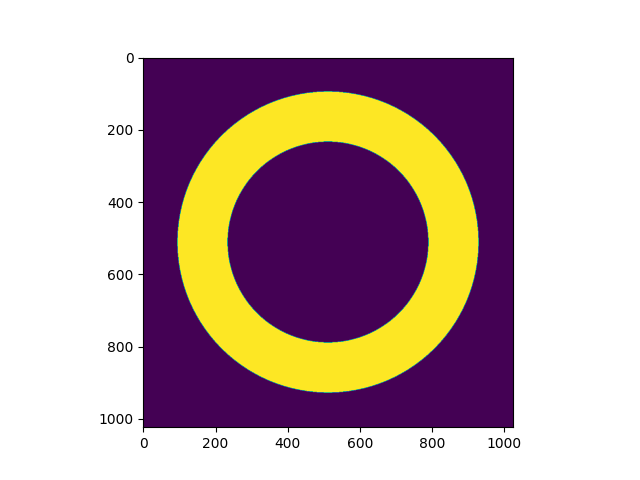

In [6]:
plt.figure()
plt.imshow(mask.sum(0))

In [8]:
class ONN(nn.Module):
    def __init__(self, config: Config, mask: torch.Tensor, propagator, doe): 
        super(ONN, self).__init__()
        self.config: Config = config
        self.mask: torch.Tensor = mask.float()
        self.doe = doe
        self.__ImageZeroPad = nn.ZeroPad2d(int((self.config.array_size - self.config.image_size)/2))
        self.propagator = propagator

    def prepare(self, W):
        W = nn.functional.interpolate(W,
                                      [self.config.image_size, self.config.image_size],
                                      mode = "nearest") 
        W = W / ((W.abs()**2).sum((1, 2, 3))[:, None, None, None]**0.5) * np.sqrt(500)
        return self.__ImageZeroPad(W)
 
    def forward(self, W):
        W = self.prepare(W)
        
        W = self.propagator(W)
        W = self.doe(W)
        W = self.propagator(W)
        
        distribution = W * self.mask
        distribution = distribution.abs()**2
        distribution = distribution.sum((2, 3))
        return W, distribution

In [9]:
onn = ONN(config, mask, prop, doe).cuda()
onn.mask = onn.mask.cuda()

In [10]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(onn.parameters(), lr=0.03)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.999)

In [11]:
train(onn, train_loader,
          criterion, optimizer,
          scheduler, num_epochs=5,
          device=torch.device('cuda'),
          # func_transform=lambda labels:torch.tensor([[ 1. if j == labels[i] else 0. for j in range(10)] for i in range(len(labels))]).cuda()
         )

  0%|          | 0/30000 [00:00<?, ?it/s]

RuntimeError: CUDA error: an illegal memory access was encountered
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

In [ ]:
for count in range(len(doe)):
    doe[count].surface.requires_grad = True
    optimizer = torch.optim.Adam(onn.parameters(), lr=0.03)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.998)
    train(onn, train_loader,
          criterion, optimizer,
          scheduler, num_epochs=1,
          device=torch.device('cuda'),
          # func_transform=lambda labels:torch.tensor([[ 1. if j == labels[i] else 0. for j in range(10)] for i in range(len(labels))]).cuda()
         )
    doe[count].surface.requires_grads = False

In [ ]:
out = test(onn, test_loader, torch.device('cuda'), True, True)
e = out[1].data.reset_index(drop = True).get("Поданное число")
mc = min([(sorted(e[i])[9]-sorted(e[i])[8])/(sorted(e[i])[9]+sorted(e[i])[8]) for i in e])
print(f"Minimum contrast: {mc}")

Accuracy: 80.53%
Minimum contrast: 0.1103

80.82
Minimum contrast: 0.1506

In [ ]:
plt.figure()
plt.imshow(doe(torch.ones((1024, 1024))).angle().cpu().detach()[0,0], cmap='twilight_shifted')
plt.colorbar()